In [33]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
import pandas as pd
from datetime import datetime
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
import warnings
import matplotlib.pyplot as plt
df = pd.read_csv('stations_data.csv', sep=',')
def map_to_five(x):
    return min(x, 5)
df['rounded_last_update_5mins'] = pd.to_datetime(df['rounded_last_update_5mins'])
df['time_as_fraction'] = df['rounded_last_update_5mins'].dt.hour * 3600 + df['rounded_last_update_5mins'].dt.minute * 60 + df['rounded_last_update_5mins'].dt.second
weekday=df['rounded_last_update_5mins'].dt.dayofweek
weekdaydf = pd.get_dummies(weekday, prefix='day_of_week')
df = pd.concat([df, weekdaydf], axis=1)



In [47]:
x_set = df[['number','time_as_fraction','day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','day_of_week_5','day_of_week_6','temp','feels_like']]
y_set = df['available_bike_stands']
print(x_set.shape)


(622721, 11)


In [21]:
station_number = x_set['number'].unique()
print(station_number)
x_set.columns

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  47  48  49  50  51  52  53  54  55
  56  57  58  59  60  61  62  63  64  65  66  67  68  69  71  72  73  74
  75  76  77  78  79  80  82  83  84  85  86  87  88  89  90  91  92  93
  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111
 112 113 114 115 116 117]


Index(['number', 'time_as_fraction', 'day_of_week_0', 'day_of_week_1',
       'day_of_week_2', 'day_of_week_3', 'day_of_week_4', 'day_of_week_5',
       'day_of_week_6', 'temp', 'feels_like'],
      dtype='object')

8.98172323759791
<class 'pandas.core.frame.DataFrame'> 1915 1915


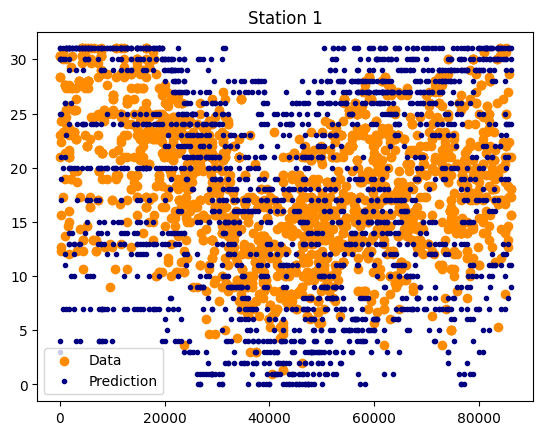

22.991202346041057
<class 'pandas.core.frame.DataFrame'> 1705 1705


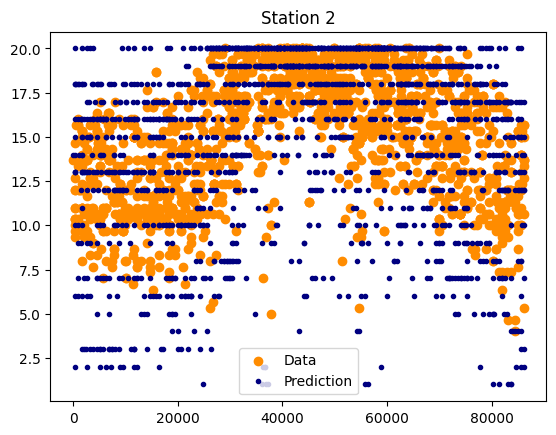

14.603691639522259
<class 'pandas.core.frame.DataFrame'> 1842 1842


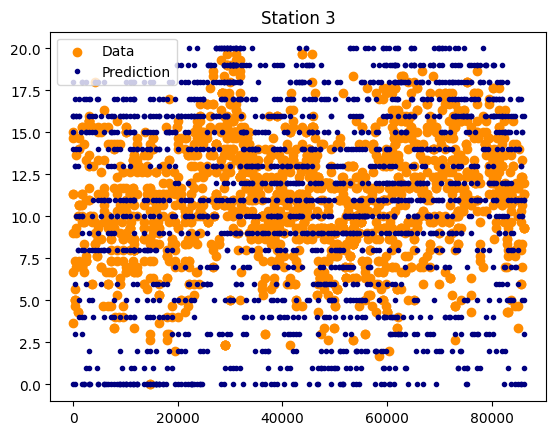

15.610328638497654
<class 'pandas.core.frame.DataFrame'> 1704 1704


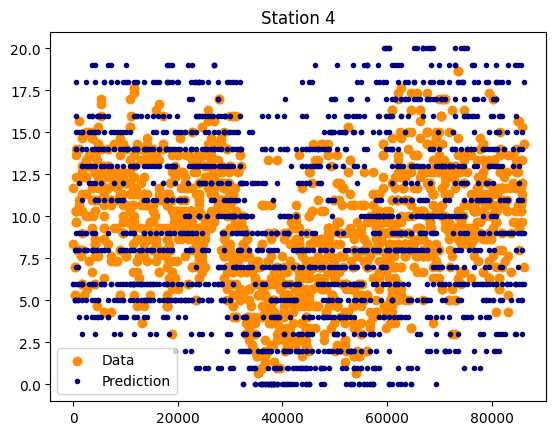

10.82375478927203
<class 'pandas.core.frame.DataFrame'> 2088 2088


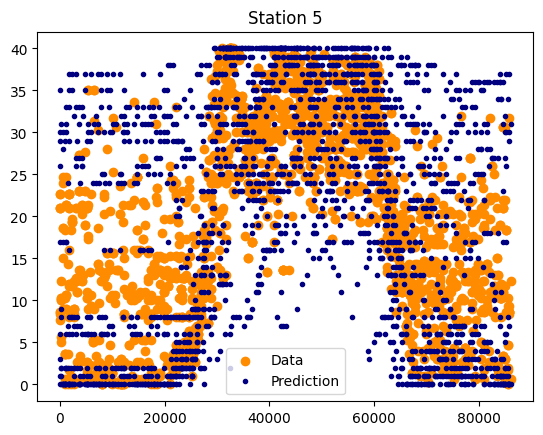

18.617932609937178
<class 'pandas.core.frame.DataFrame'> 1751 1751


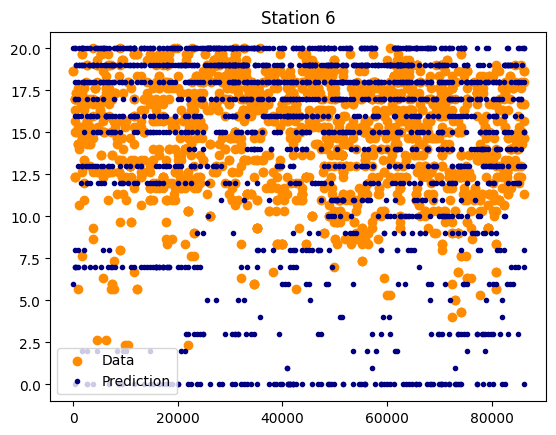

8.956109134045077
<class 'pandas.core.frame.DataFrame'> 1686 1686


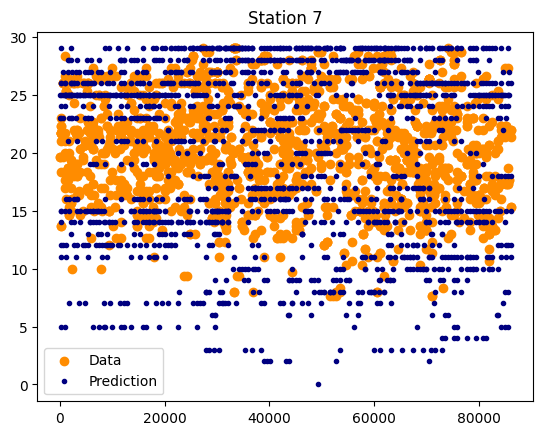

12.619406737053795
<class 'pandas.core.frame.DataFrame'> 1989 1989


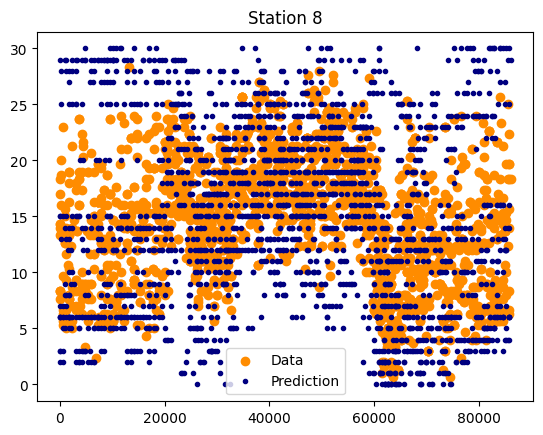

13.06024096385542
<class 'pandas.core.frame.DataFrame'> 2075 2075


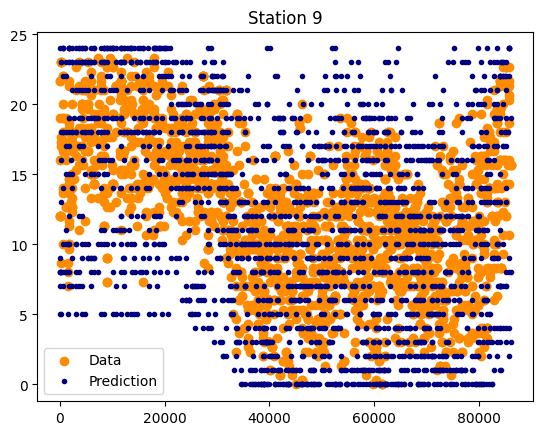

21.711229946524064
<class 'pandas.core.frame.DataFrame'> 1870 1870


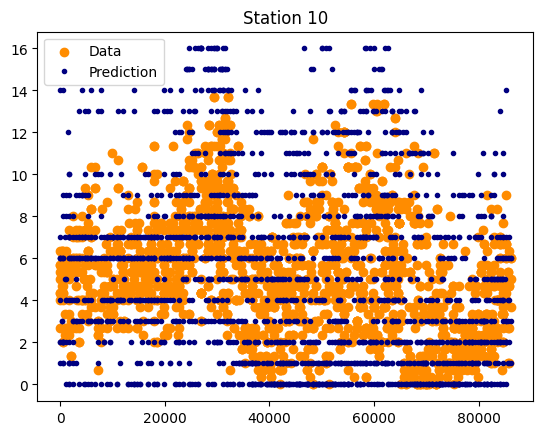

33.908387864366446
<class 'pandas.core.frame.DataFrame'> 1681 1681


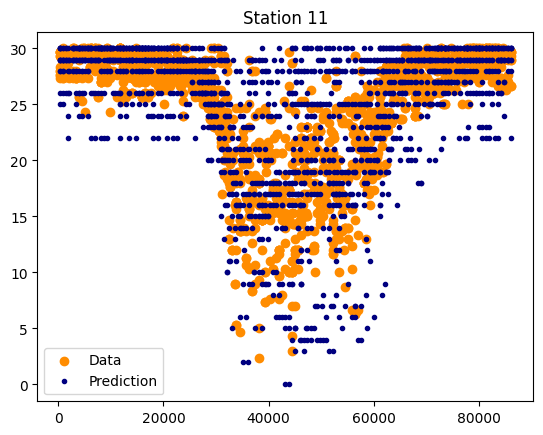

23.00357568533969
<class 'pandas.core.frame.DataFrame'> 1678 1678


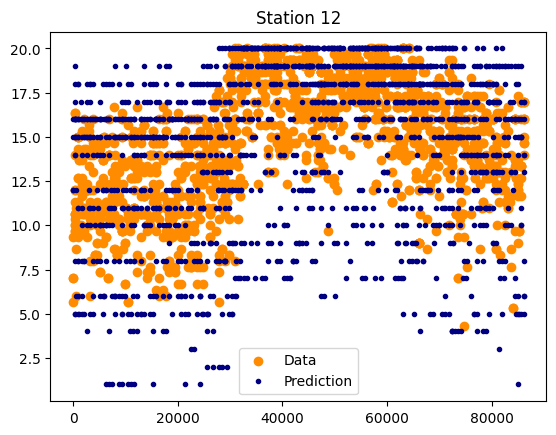

26.545454545454543
<class 'pandas.core.frame.DataFrame'> 1650 1650


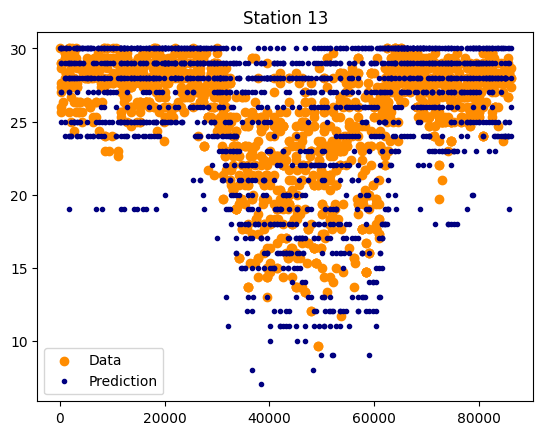

12.589194699286443
<class 'pandas.core.frame.DataFrame'> 1962 1962


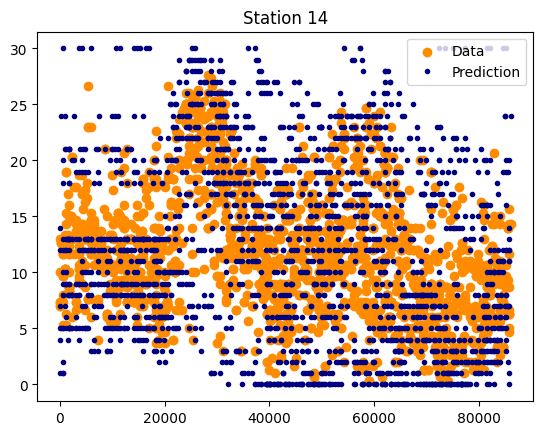

29.20094007050529
<class 'pandas.core.frame.DataFrame'> 1702 1702


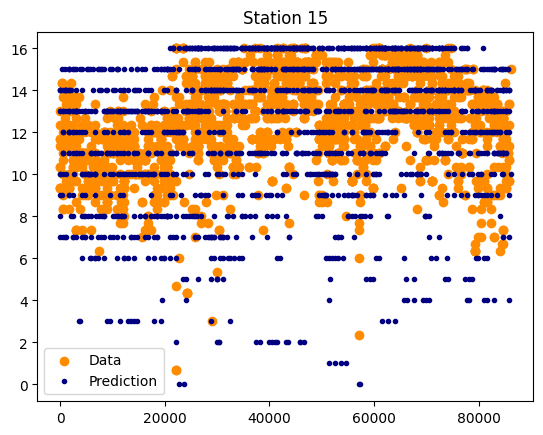

15.011037527593817
<class 'pandas.core.frame.DataFrame'> 1812 1812


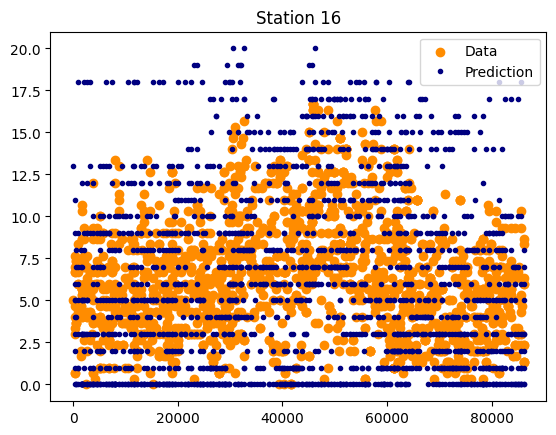

35.304553518628026
<class 'pandas.core.frame.DataFrame'> 1691 1691


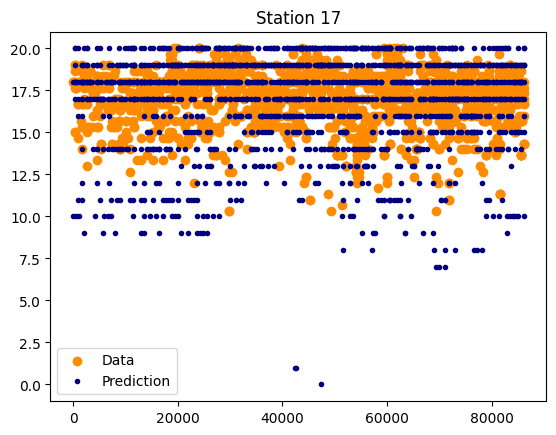

15.287588294651865
<class 'pandas.core.frame.DataFrame'> 1982 1982


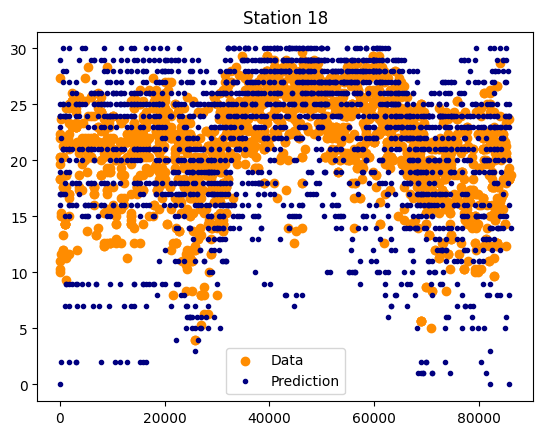

20.097323600973237
<class 'pandas.core.frame.DataFrame'> 2055 2055


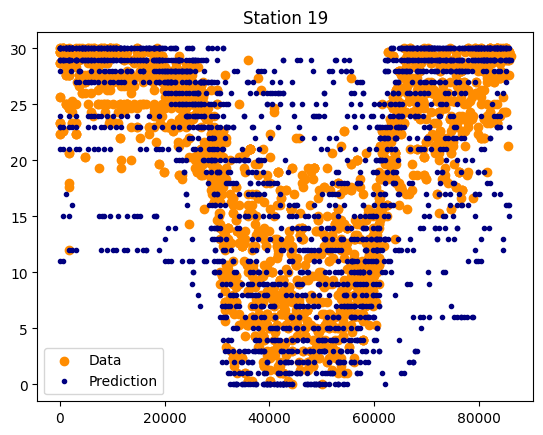

29.241459177764913
<class 'pandas.core.frame.DataFrame'> 1727 1727


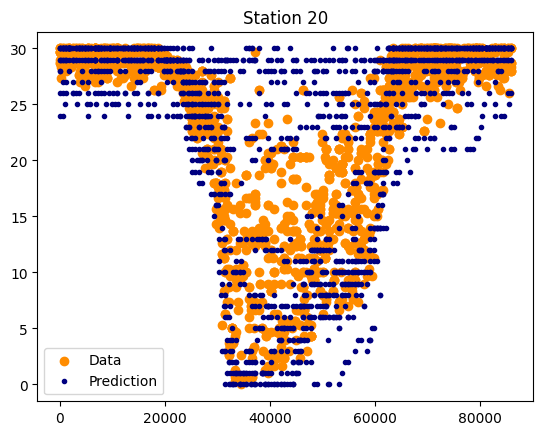

11.157674174960713
<class 'pandas.core.frame.DataFrame'> 1909 1909


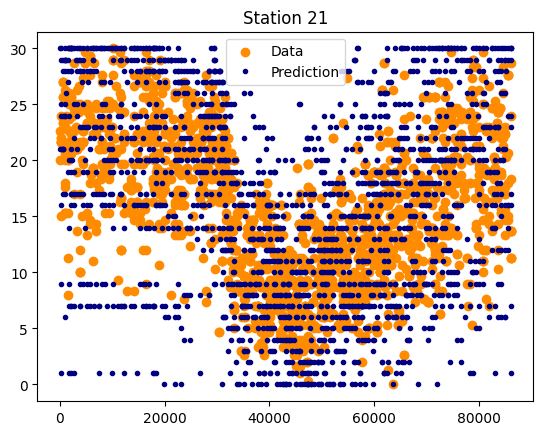

12.956298200514137
<class 'pandas.core.frame.DataFrame'> 1945 1945


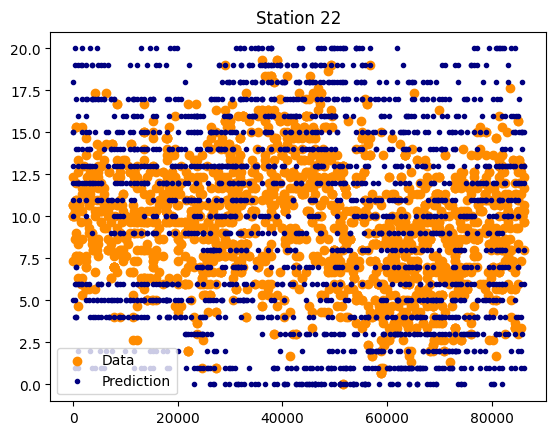

15.641569459172851
<class 'pandas.core.frame.DataFrame'> 1886 1886


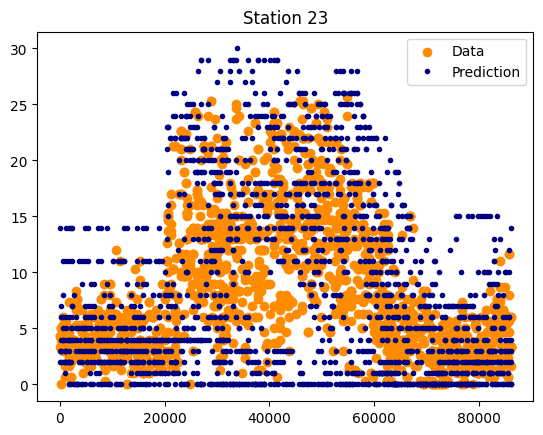

15.357502517623365
<class 'pandas.core.frame.DataFrame'> 1986 1986


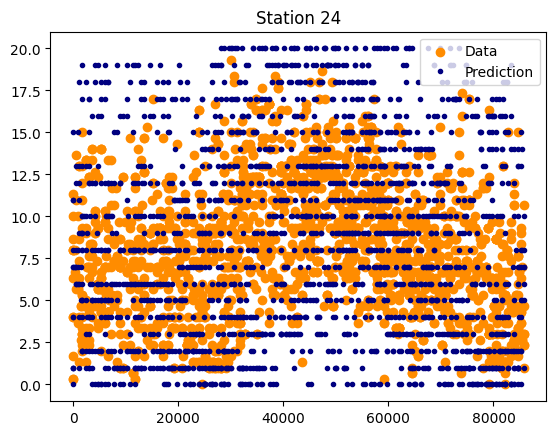

16.550522648083625
<class 'pandas.core.frame.DataFrame'> 1722 1722


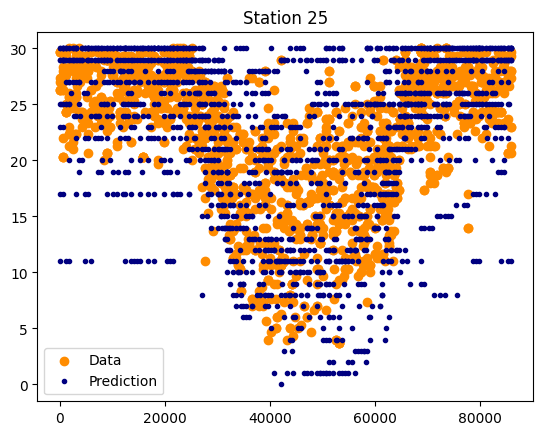

16.213214880621877
<class 'pandas.core.frame.DataFrame'> 1801 1801


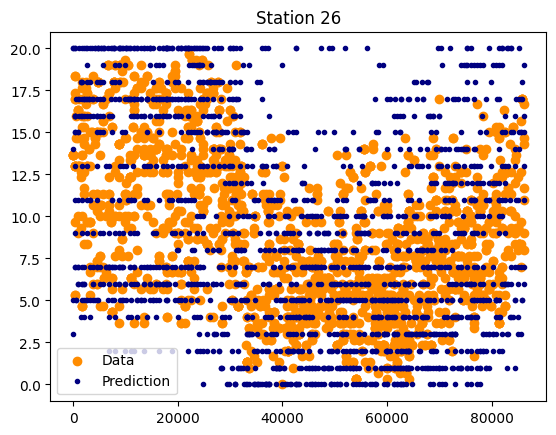

20.724560468833246
<class 'pandas.core.frame.DataFrame'> 1877 1877


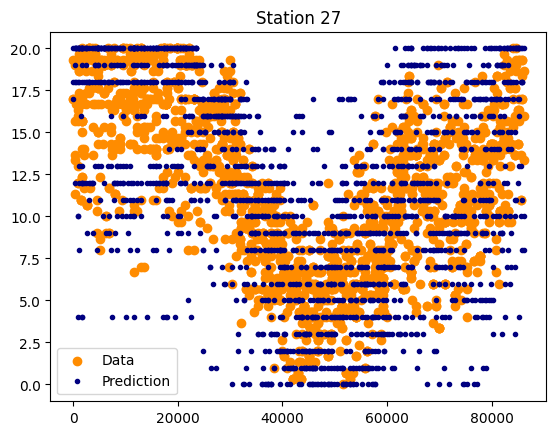

12.035010940919037
<class 'pandas.core.frame.DataFrame'> 1828 1828


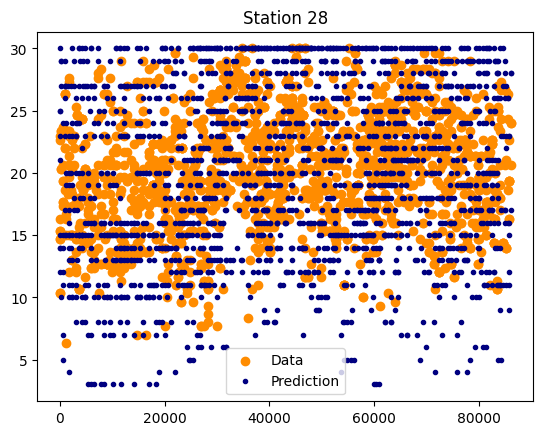

10.080645161290322
<class 'pandas.core.frame.DataFrame'> 1984 1984


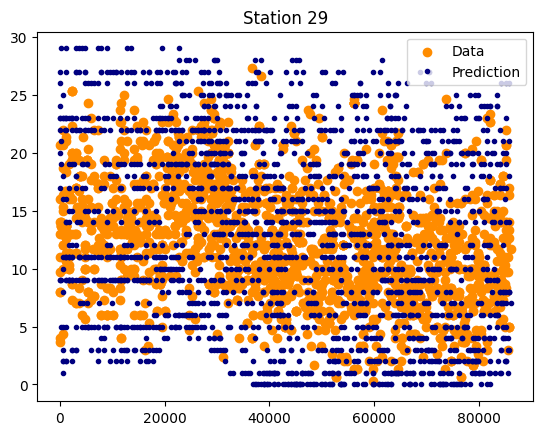

28.94572676232065
<class 'pandas.core.frame.DataFrame'> 1603 1603


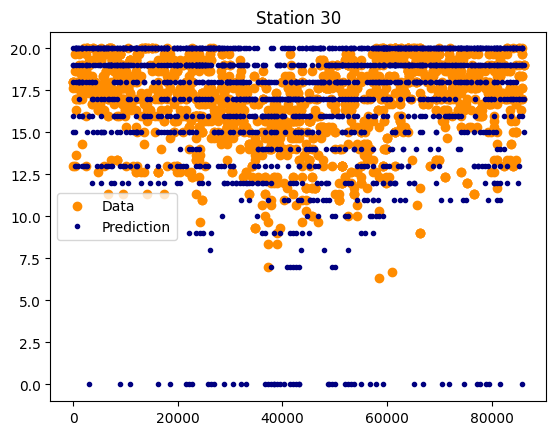

13.780551222048881
<class 'pandas.core.frame.DataFrame'> 1923 1923


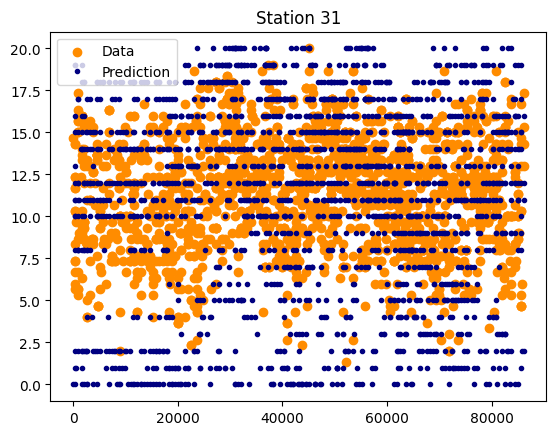

13.015399900645802
<class 'pandas.core.frame.DataFrame'> 2013 2013


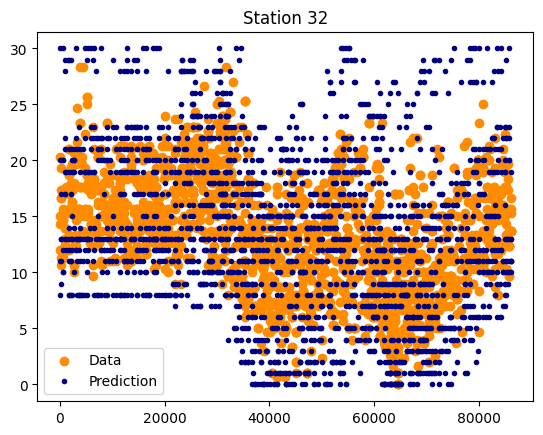

16.65884561238855
<class 'pandas.core.frame.DataFrame'> 2131 2131


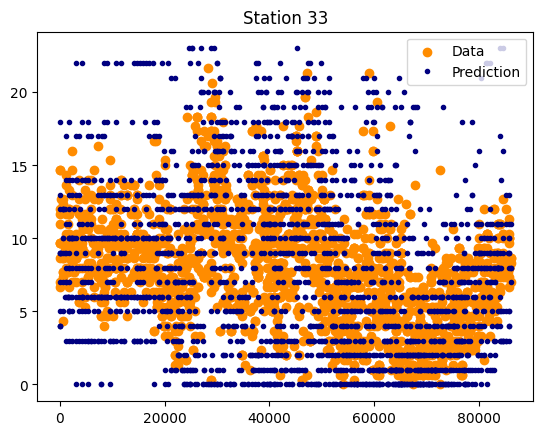

11.454809086515224
<class 'pandas.core.frame.DataFrame'> 2069 2069


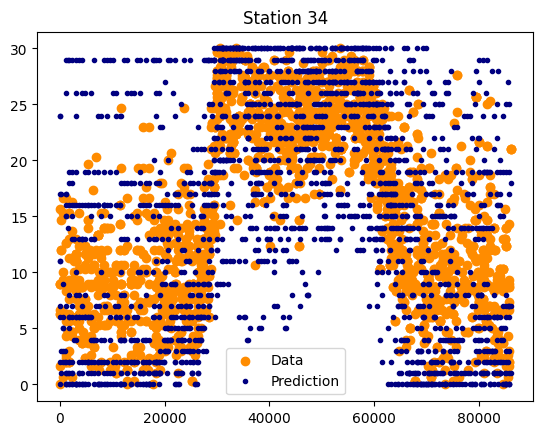

9.015971148892325
<class 'pandas.core.frame.DataFrame'> 1941 1941


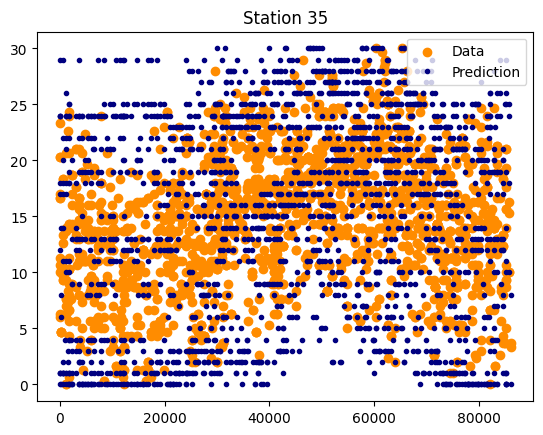

11.87953151143335
<class 'pandas.core.frame.DataFrame'> 1793 1793


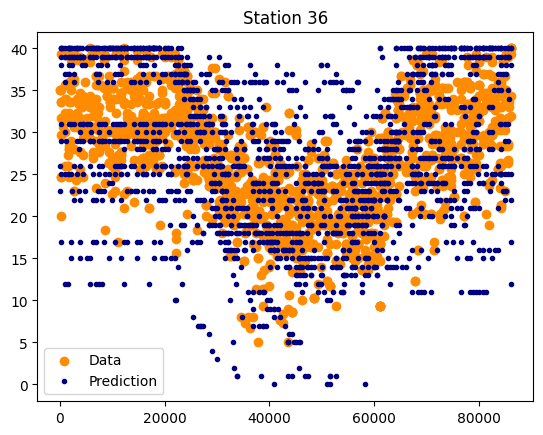

24.628712871287128
<class 'pandas.core.frame.DataFrame'> 1616 1616


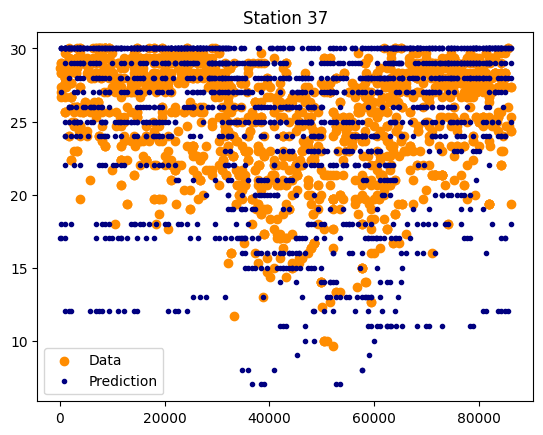

12.726382770435634
<class 'pandas.core.frame.DataFrame'> 2043 2043


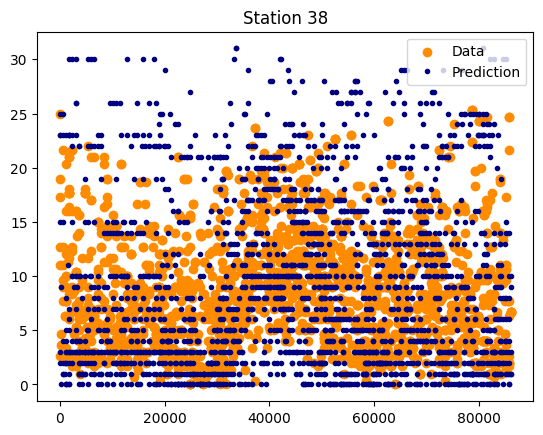

22.797131147540984
<class 'pandas.core.frame.DataFrame'> 1952 1952


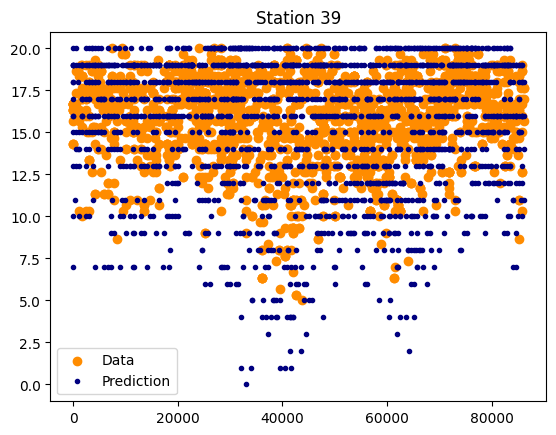

13.259376650818805
<class 'pandas.core.frame.DataFrame'> 1893 1893


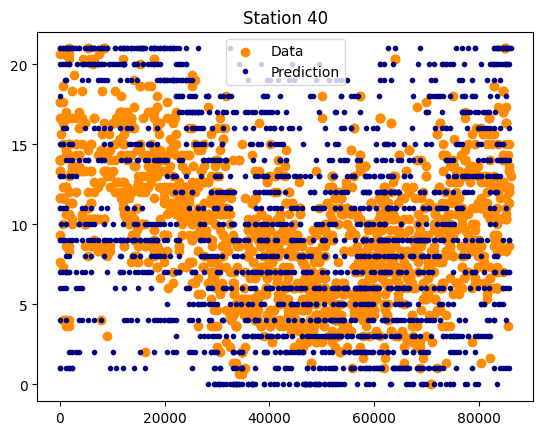

20.082693443591257
<class 'pandas.core.frame.DataFrame'> 1693 1693


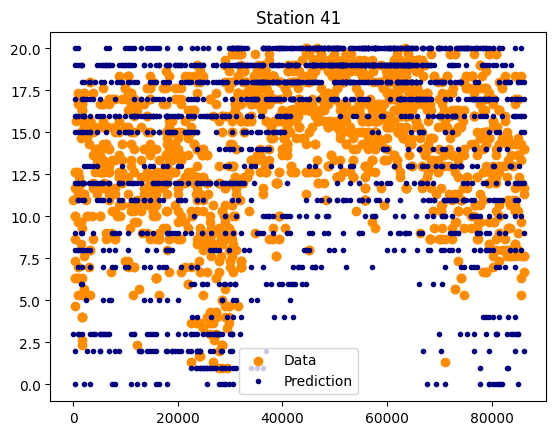

15.62829989440338
<class 'pandas.core.frame.DataFrame'> 1894 1894


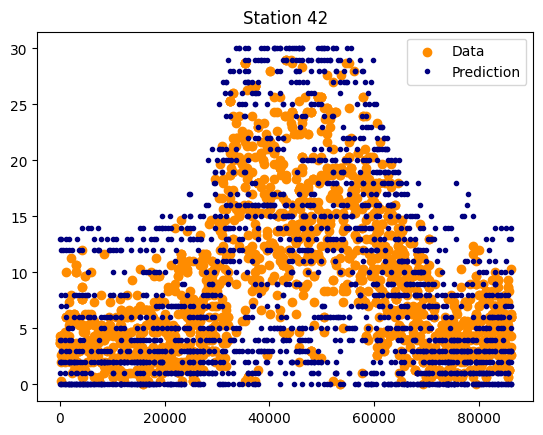

12.908496732026146
<class 'pandas.core.frame.DataFrame'> 1836 1836


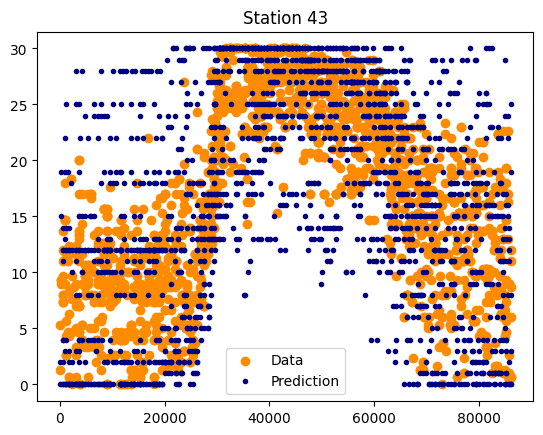

19.07481439177613
<class 'pandas.core.frame.DataFrame'> 1751 1751


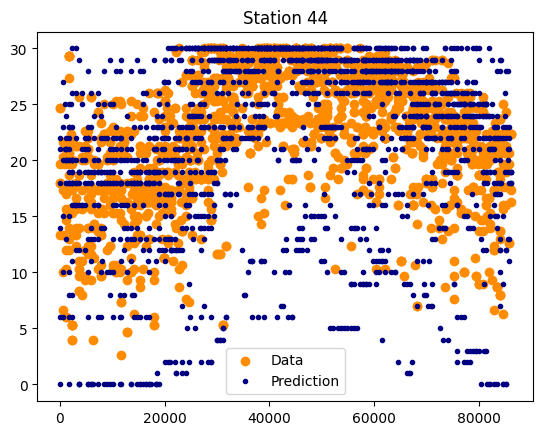

10.266591038003403
<class 'pandas.core.frame.DataFrame'> 1763 1763


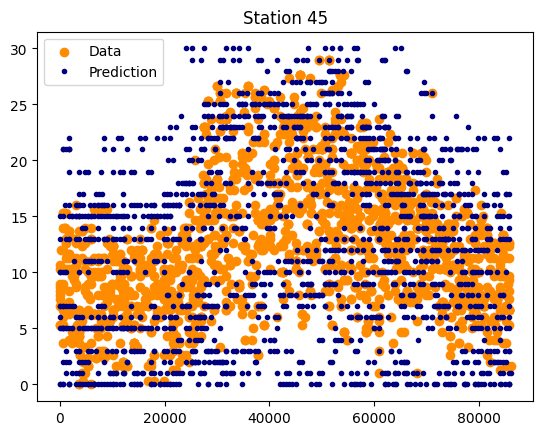

32.10621605310803
<class 'pandas.core.frame.DataFrame'> 1657 1657


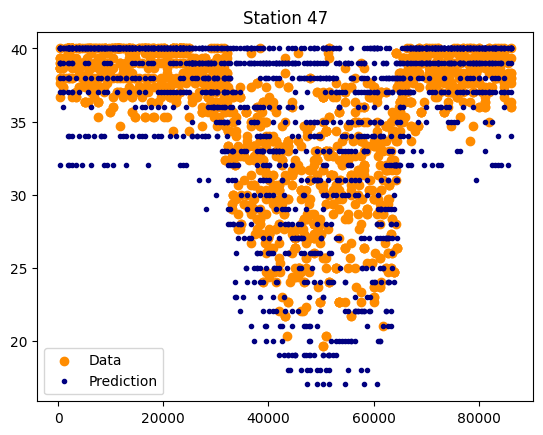

9.14007571660357
<class 'pandas.core.frame.DataFrame'> 1849 1849


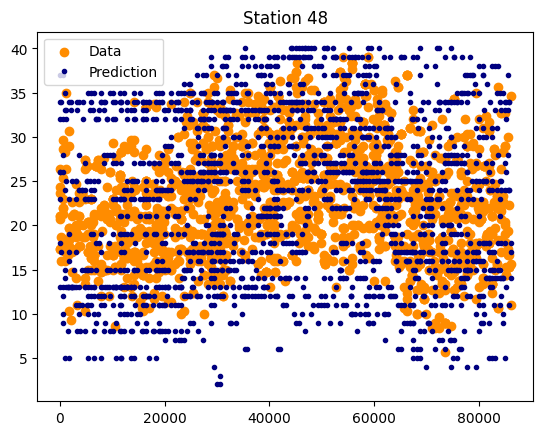

9.040959040959041
<class 'pandas.core.frame.DataFrame'> 2002 2002


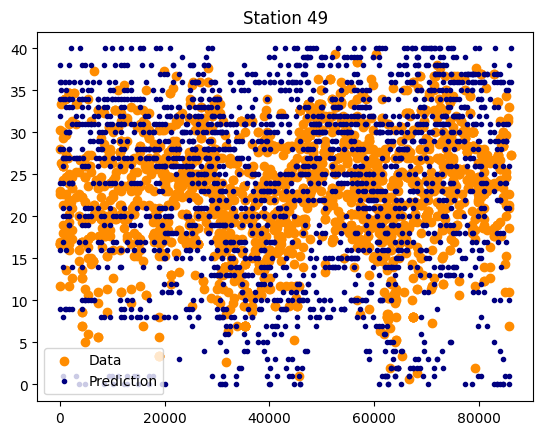

8.204334365325078
<class 'pandas.core.frame.DataFrame'> 1938 1938


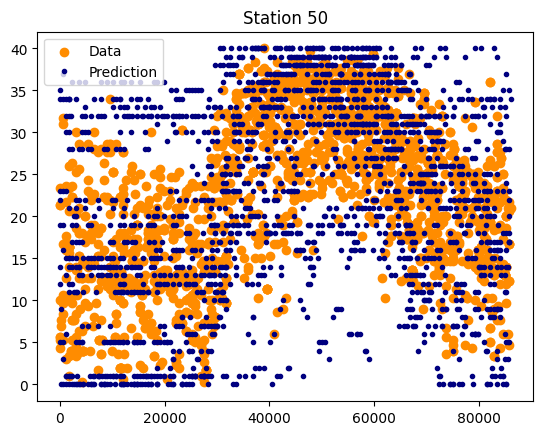

14.496169711255154
<class 'pandas.core.frame.DataFrame'> 1697 1697


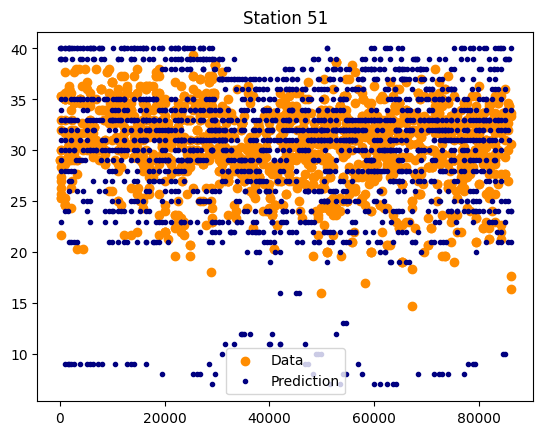

15.157232704402515
<class 'pandas.core.frame.DataFrame'> 1590 1590


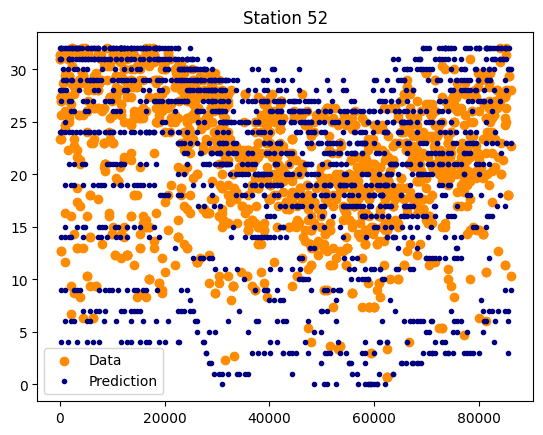

22.6875
<class 'pandas.core.frame.DataFrame'> 1600 1600


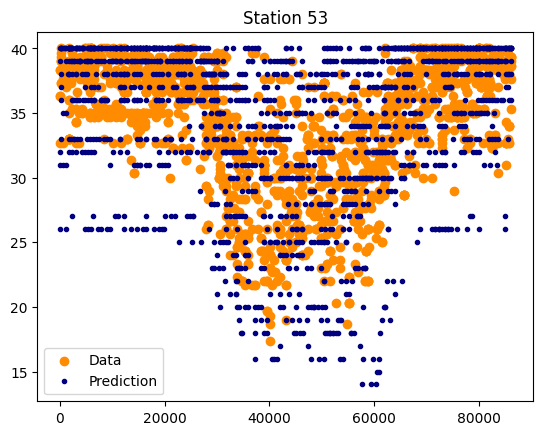

10.923881464264962
<class 'pandas.core.frame.DataFrame'> 1721 1721


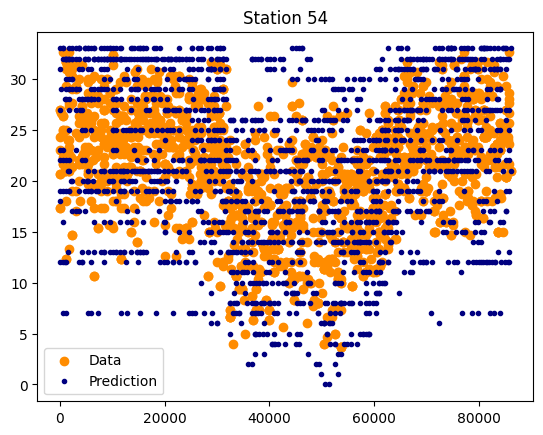

32.379248658318424
<class 'pandas.core.frame.DataFrame'> 1677 1677


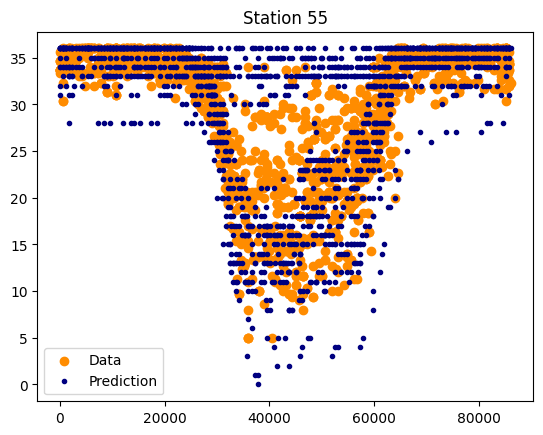

10.046130189646336
<class 'pandas.core.frame.DataFrame'> 1951 1951


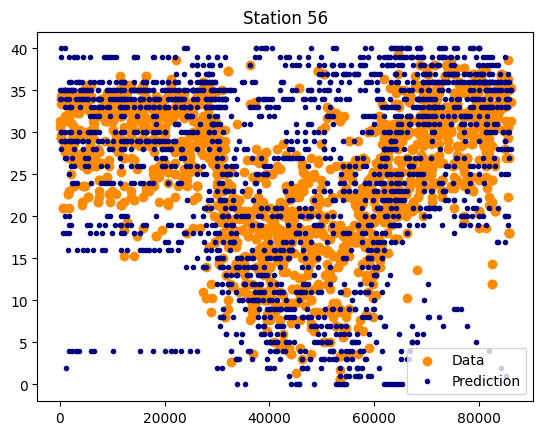

14.353499406880191
<class 'pandas.core.frame.DataFrame'> 1686 1686


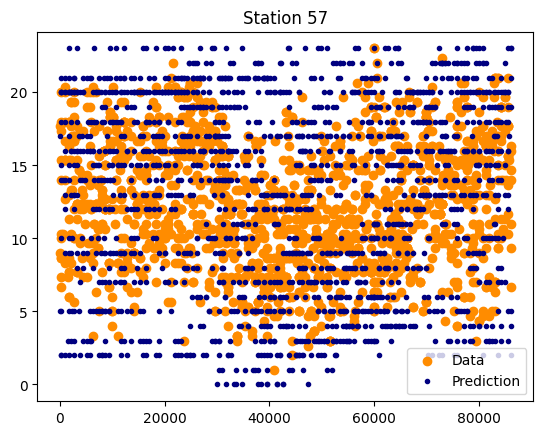

9.884281581485054
<class 'pandas.core.frame.DataFrame'> 2074 2074


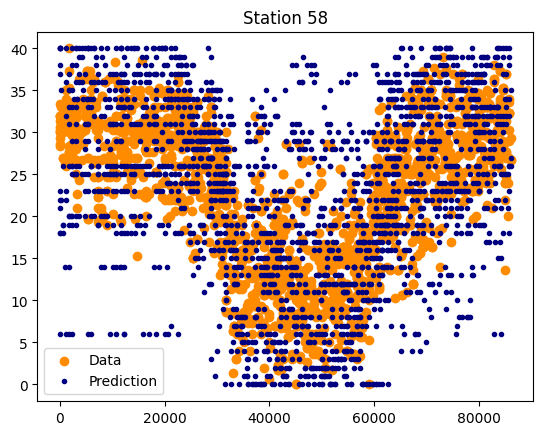

25.177725118483412
<class 'pandas.core.frame.DataFrame'> 1688 1688


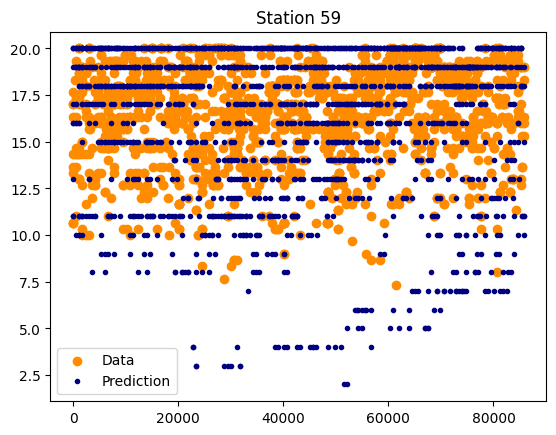

12.010309278350515
<class 'pandas.core.frame.DataFrame'> 1940 1940


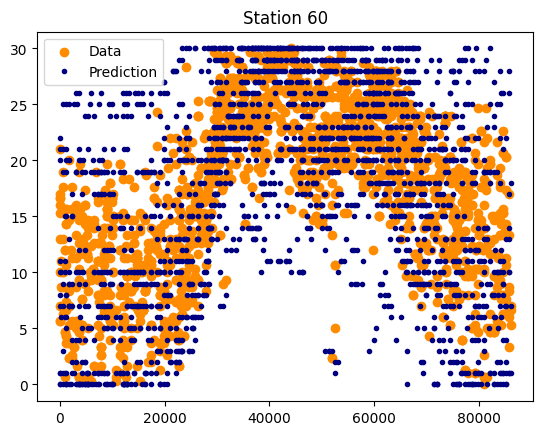

25.518925518925517
<class 'pandas.core.frame.DataFrame'> 1638 1638


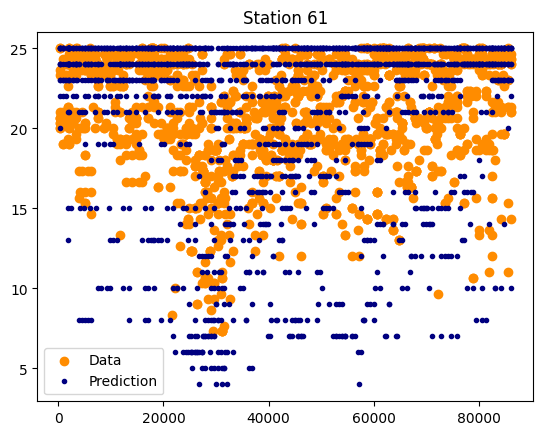

11.831442463533225
<class 'pandas.core.frame.DataFrame'> 1851 1851


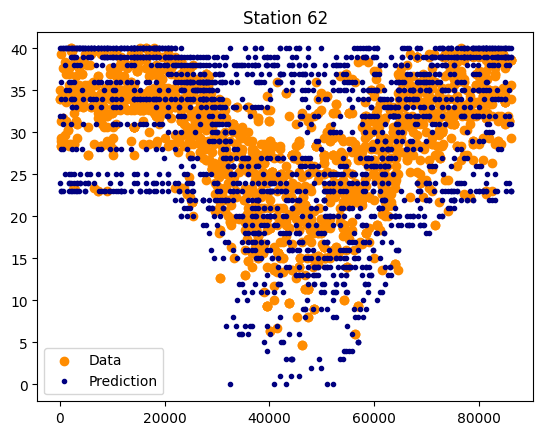

12.674483528754884
<class 'pandas.core.frame.DataFrame'> 1791 1791


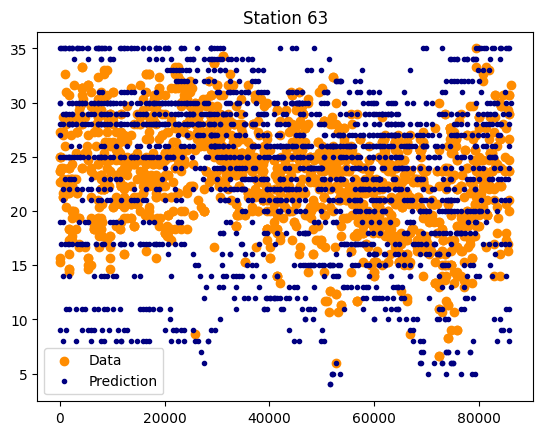

9.128847157016171
<class 'pandas.core.frame.DataFrame'> 1917 1917


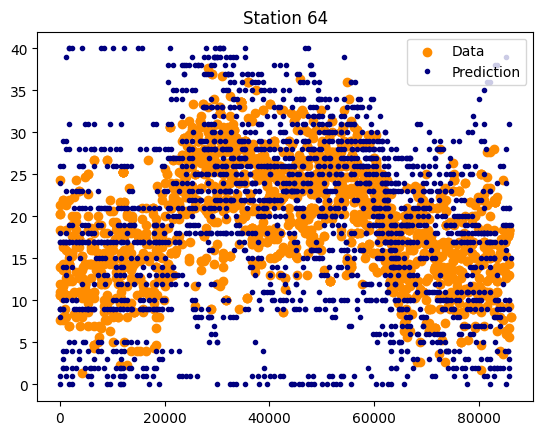

20.909090909090907
<class 'pandas.core.frame.DataFrame'> 1650 1650


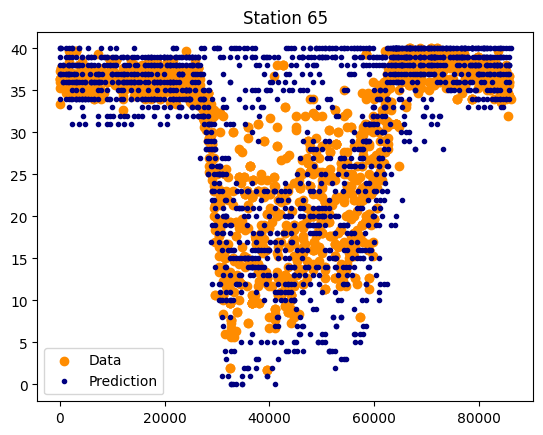

14.254975793437334
<class 'pandas.core.frame.DataFrame'> 1859 1859


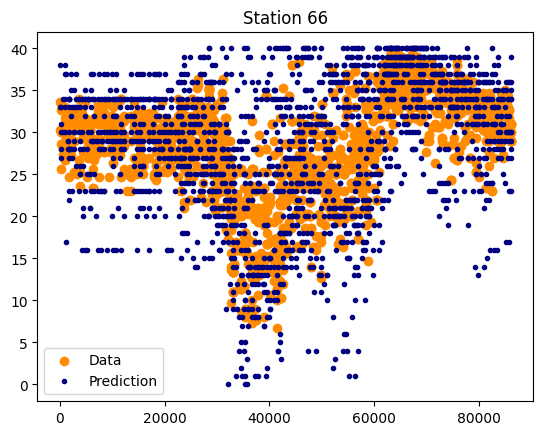

9.51669157947185
<class 'pandas.core.frame.DataFrame'> 2007 2007


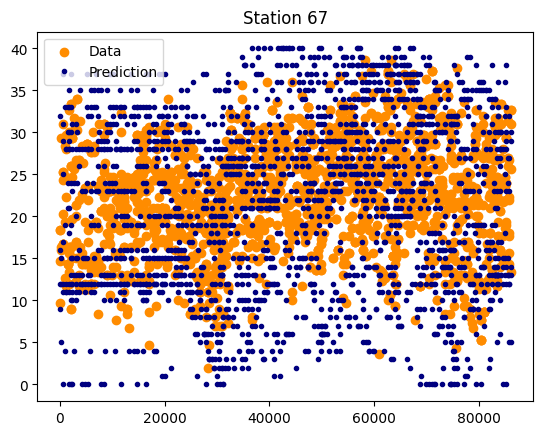

10.648836057454185
<class 'pandas.core.frame.DataFrame'> 2019 2019


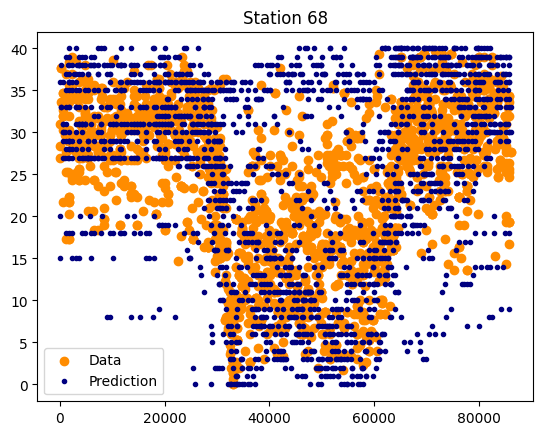

8.35927078701645
<class 'pandas.core.frame.DataFrame'> 2249 2249


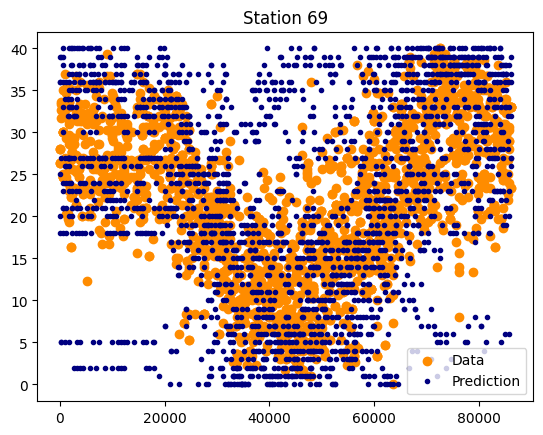

16.88815060908084
<class 'pandas.core.frame.DataFrame'> 1806 1806


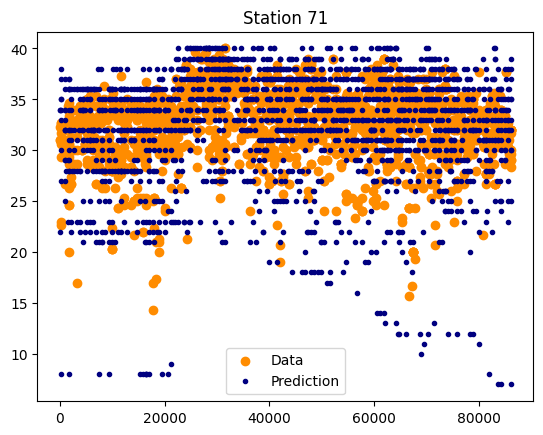

15.632054176072236
<class 'pandas.core.frame.DataFrame'> 1772 1772


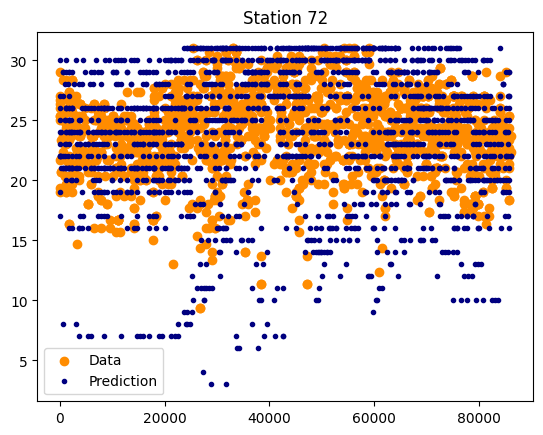

19.415900486749592
<class 'pandas.core.frame.DataFrame'> 1849 1849


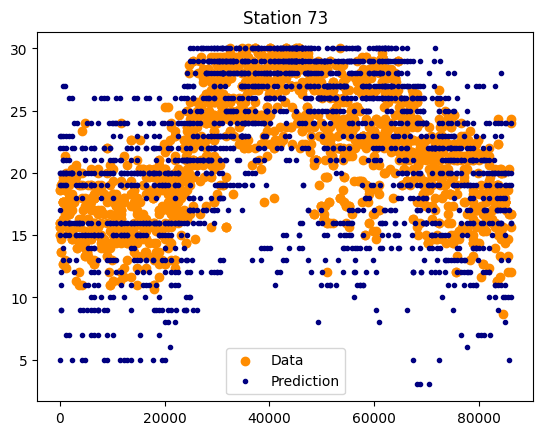

10.178263369752731
<class 'pandas.core.frame.DataFrame'> 1739 1739


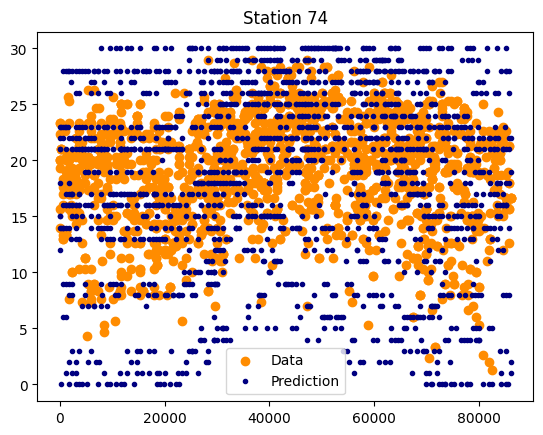

8.37028824833703
<class 'pandas.core.frame.DataFrame'> 1804 1804


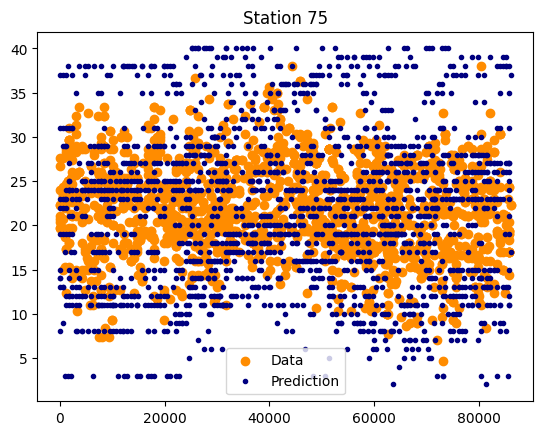

10.910151691948657
<class 'pandas.core.frame.DataFrame'> 1714 1714


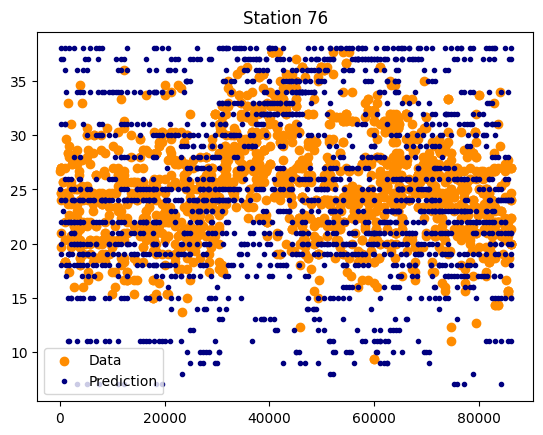

10.22604951560818
<class 'pandas.core.frame.DataFrame'> 1858 1858


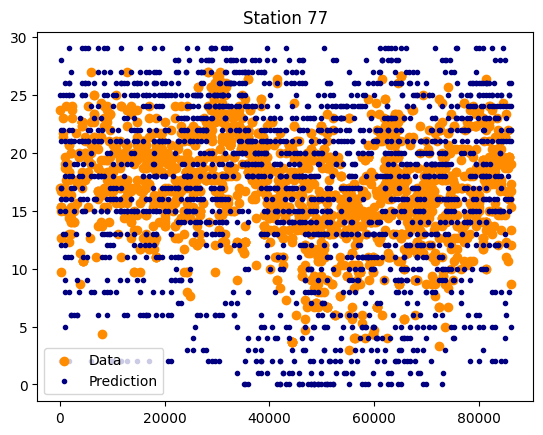

11.098398169336384
<class 'pandas.core.frame.DataFrame'> 1748 1748


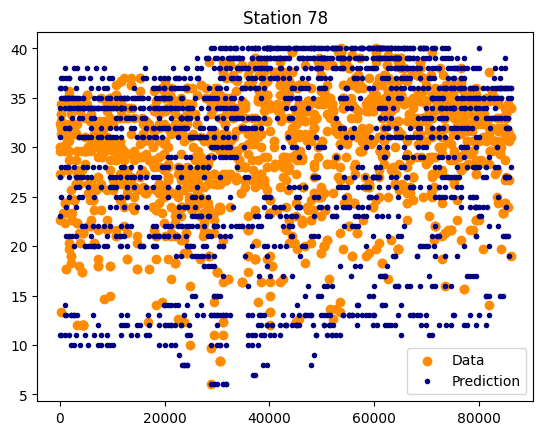

31.93384223918575
<class 'pandas.core.frame.DataFrame'> 1572 1572


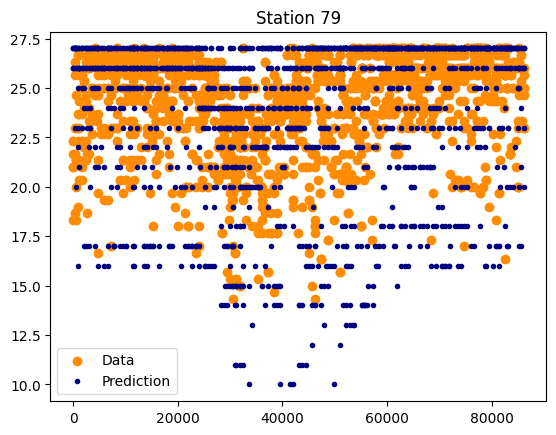

10.67351598173516
<class 'pandas.core.frame.DataFrame'> 1752 1752


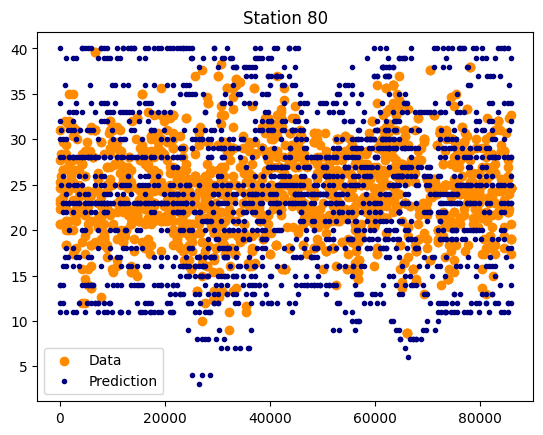

17.712865133623367
<class 'pandas.core.frame.DataFrame'> 1609 1609


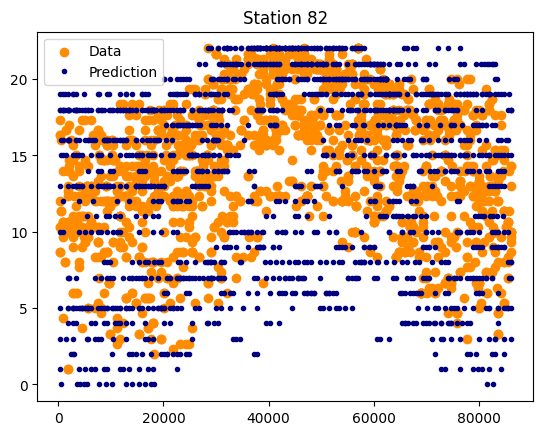

11.366245694603903
<class 'pandas.core.frame.DataFrame'> 1742 1742


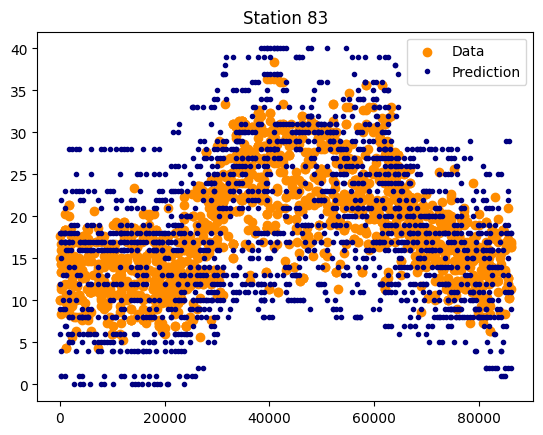

13.353474320241693
<class 'pandas.core.frame.DataFrame'> 1655 1655


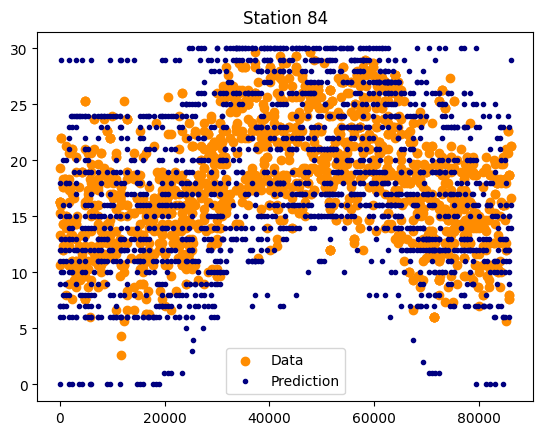

9.703660662405579
<class 'pandas.core.frame.DataFrame'> 1721 1721


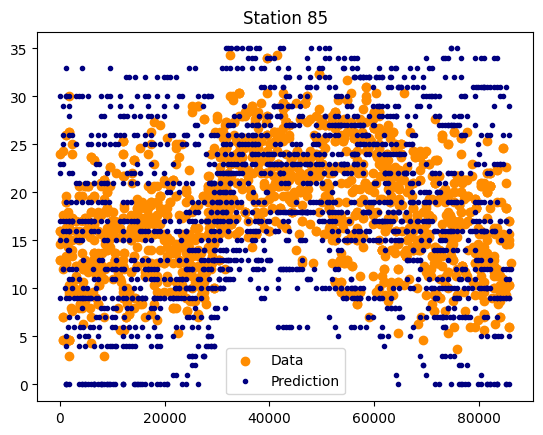

12.78882321332617
<class 'pandas.core.frame.DataFrame'> 1861 1861


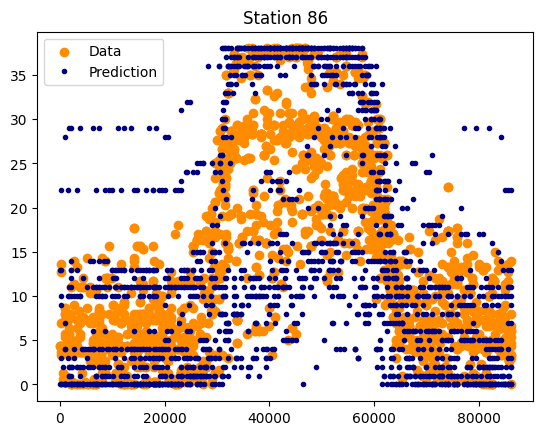

8.43857634902411
<class 'pandas.core.frame.DataFrame'> 1742 1742


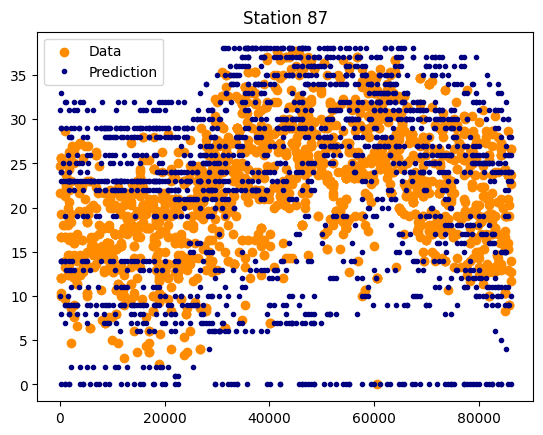

9.765625
<class 'pandas.core.frame.DataFrame'> 1792 1792


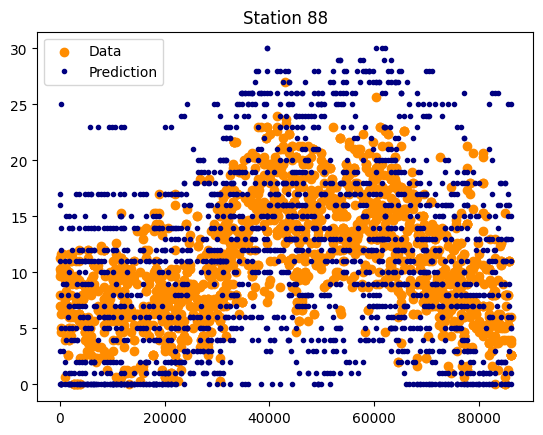

48.69727047146402
<class 'pandas.core.frame.DataFrame'> 1612 1612


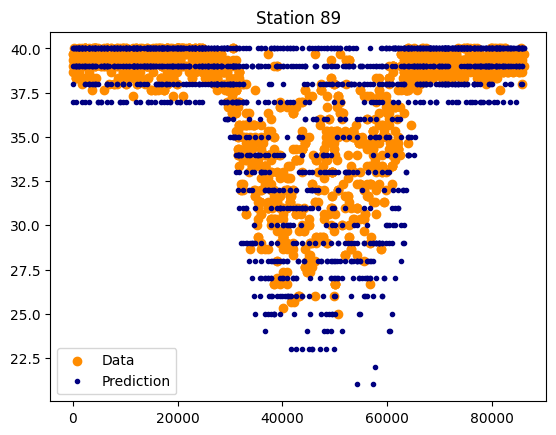

14.495028780743066
<class 'pandas.core.frame.DataFrame'> 1911 1911


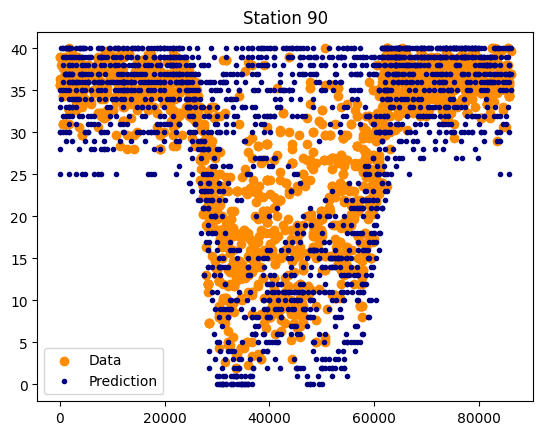

9.92023928215354
<class 'pandas.core.frame.DataFrame'> 2006 2006


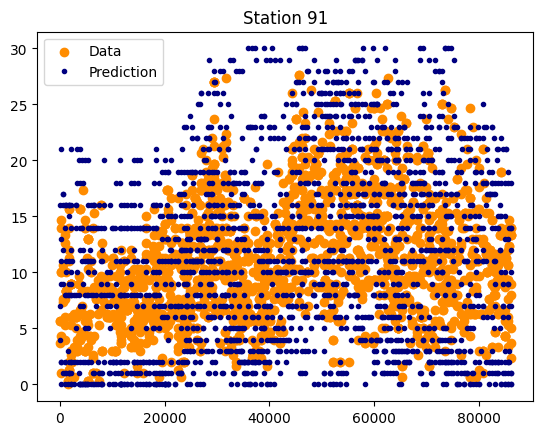

13.076923076923078
<class 'pandas.core.frame.DataFrame'> 1820 1820


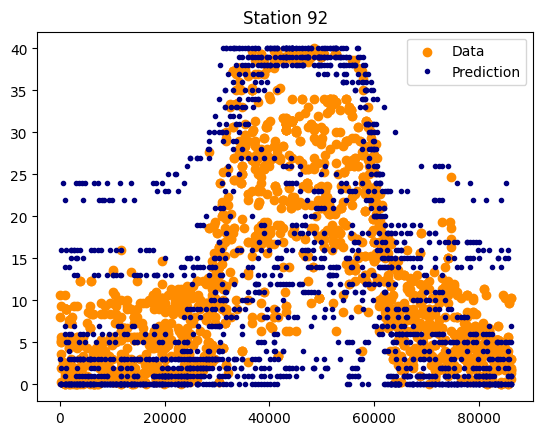

16.80722891566265
<class 'pandas.core.frame.DataFrame'> 1660 1660


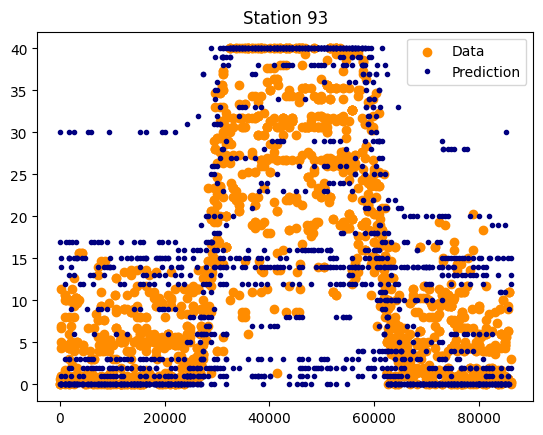

9.709338280766852
<class 'pandas.core.frame.DataFrame'> 1617 1617


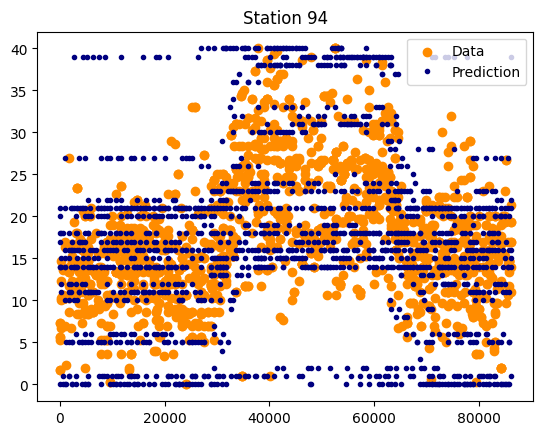

10.059815116911365
<class 'pandas.core.frame.DataFrame'> 1839 1839


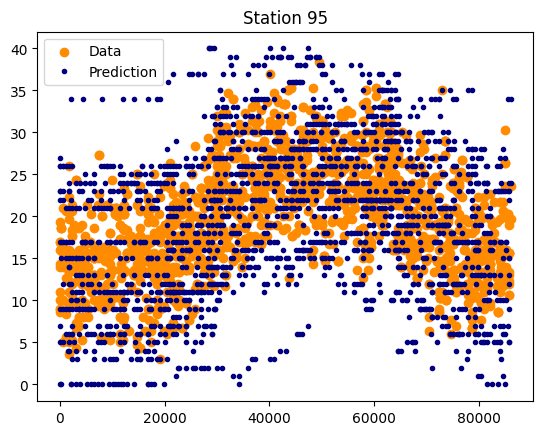

10.316967060285892
<class 'pandas.core.frame.DataFrame'> 1609 1609


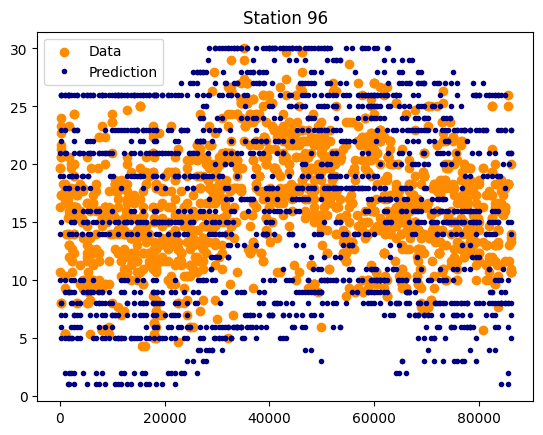

9.622960045019695
<class 'pandas.core.frame.DataFrame'> 1777 1777


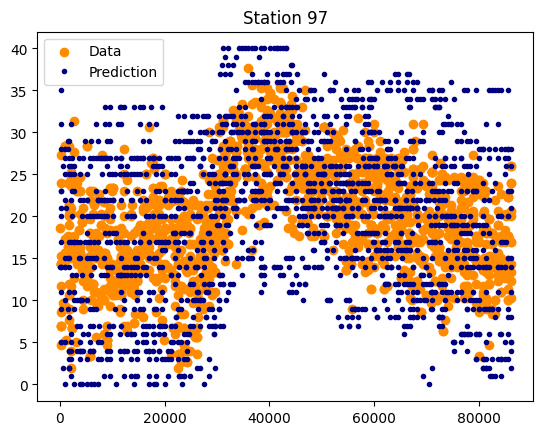

7.531865585168019
<class 'pandas.core.frame.DataFrame'> 1726 1726


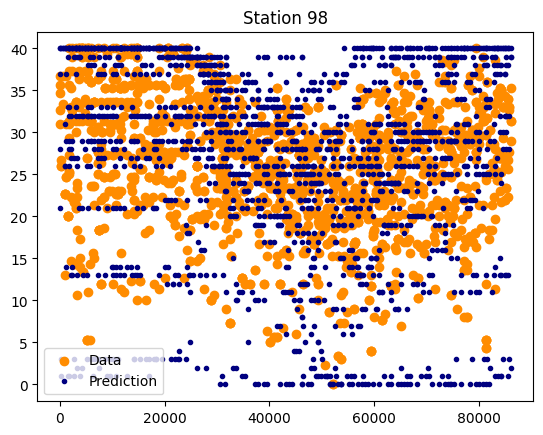

16.966879721092386
<class 'pandas.core.frame.DataFrame'> 1721 1721


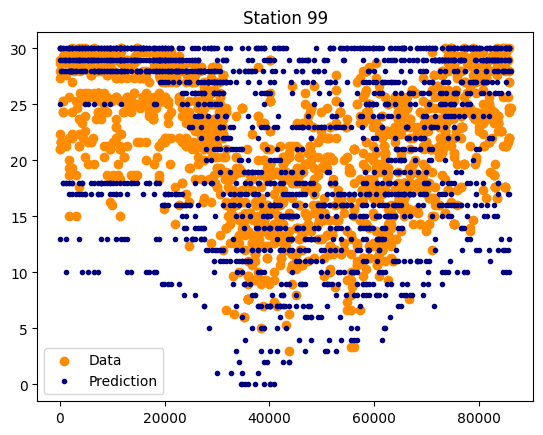

20.07700770077008
<class 'pandas.core.frame.DataFrame'> 1818 1818


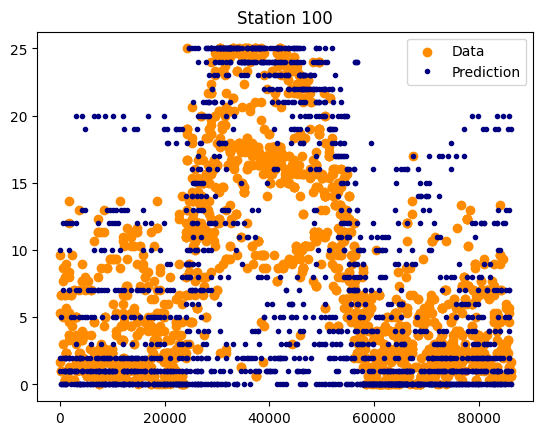

18.272425249169437
<class 'pandas.core.frame.DataFrame'> 1806 1806


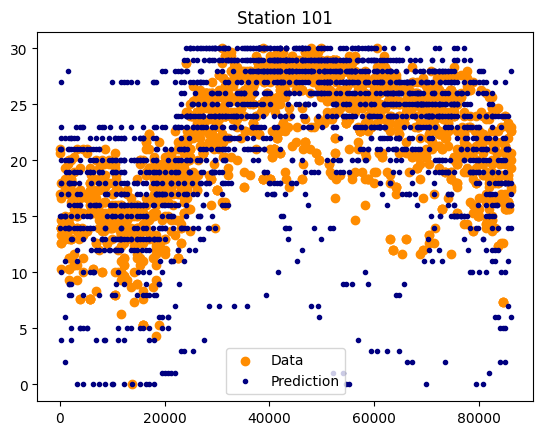

9.55223880597015
<class 'pandas.core.frame.DataFrame'> 1675 1675


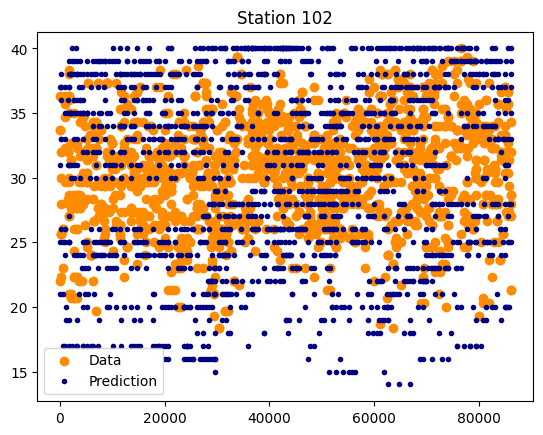

21.918639951426837
<class 'pandas.core.frame.DataFrame'> 1647 1647


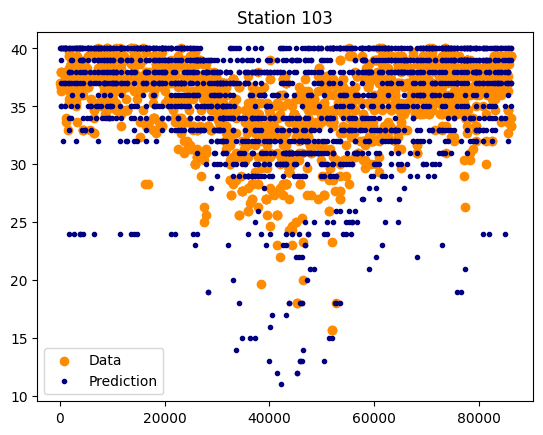

11.476466795615732
<class 'pandas.core.frame.DataFrame'> 1551 1551


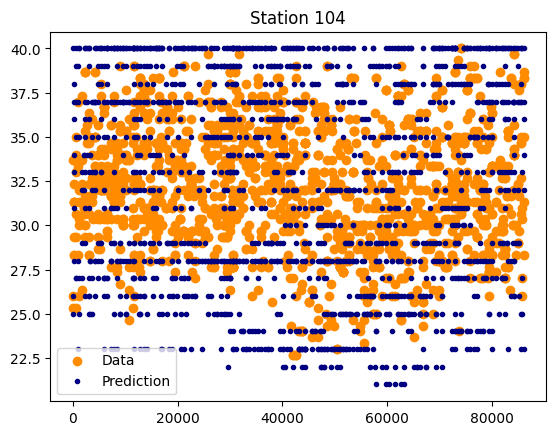

12.279596977329975
<class 'pandas.core.frame.DataFrame'> 1588 1588


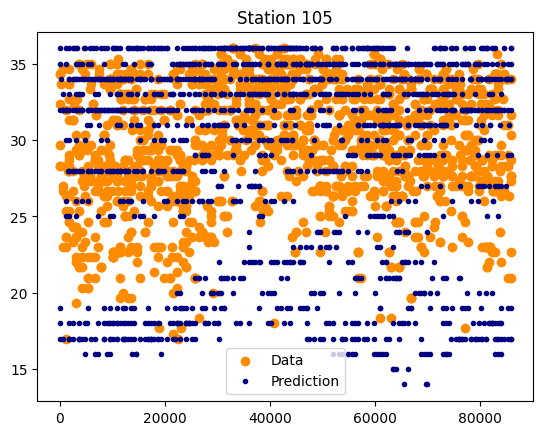

12.858851674641148
<class 'pandas.core.frame.DataFrame'> 1672 1672


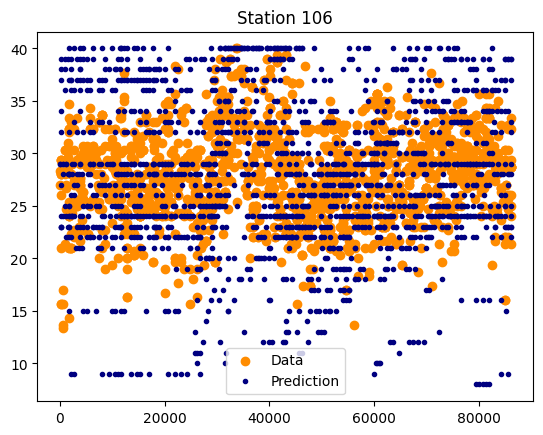

9.496236247828605
<class 'pandas.core.frame.DataFrame'> 1727 1727


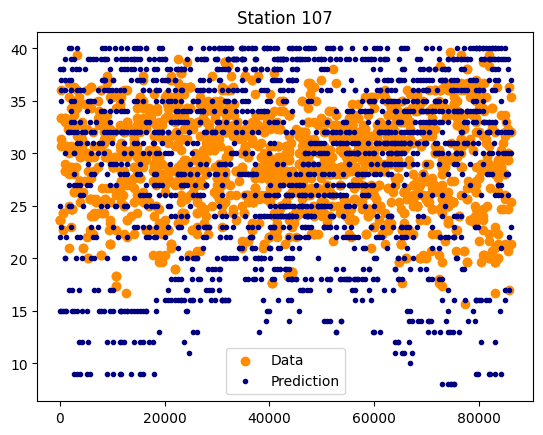

11.246376811594203
<class 'pandas.core.frame.DataFrame'> 1725 1725


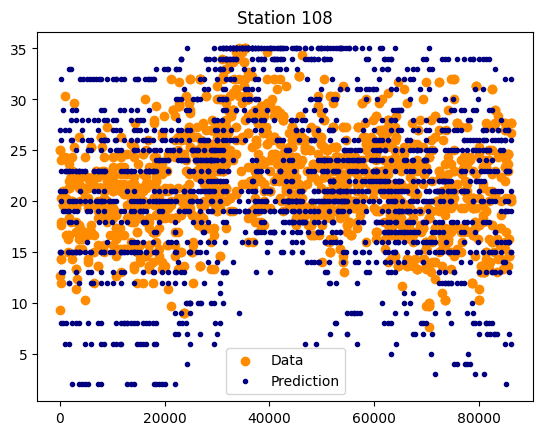

11.738148984198645
<class 'pandas.core.frame.DataFrame'> 1772 1772


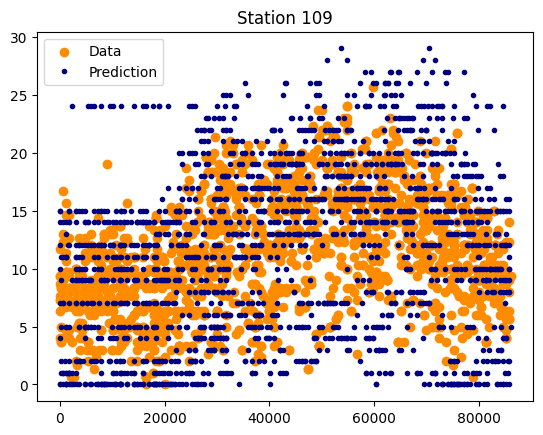

11.683642899940082
<class 'pandas.core.frame.DataFrame'> 1669 1669


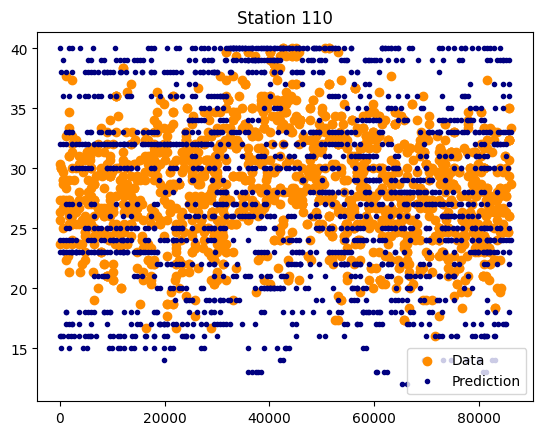

38.27298050139276
<class 'pandas.core.frame.DataFrame'> 1795 1795


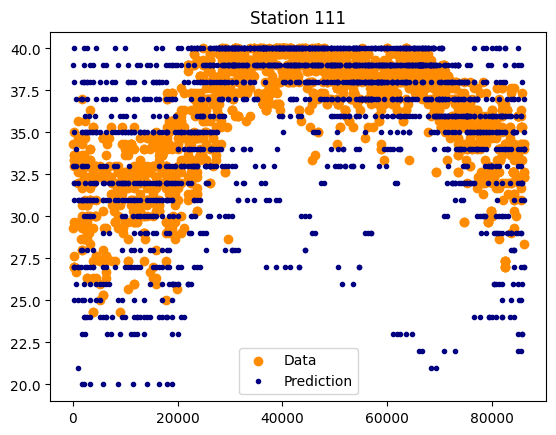

11.931818181818182
<class 'pandas.core.frame.DataFrame'> 1936 1936


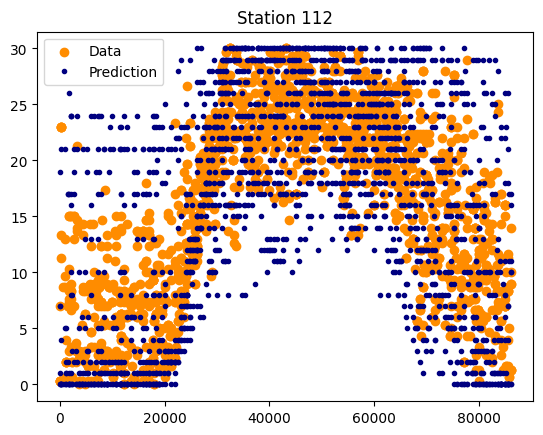

18.590143480973175
<class 'pandas.core.frame.DataFrame'> 1603 1603


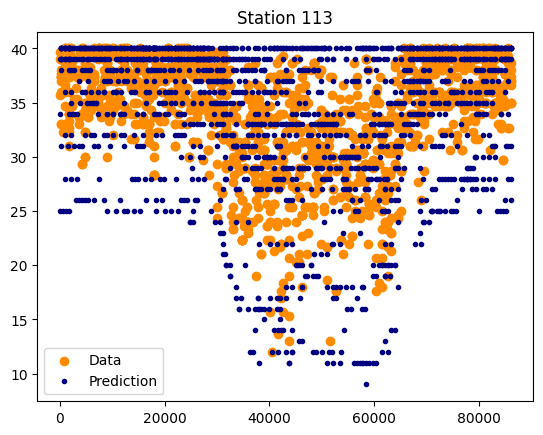

24.67880085653105
<class 'pandas.core.frame.DataFrame'> 1868 1868


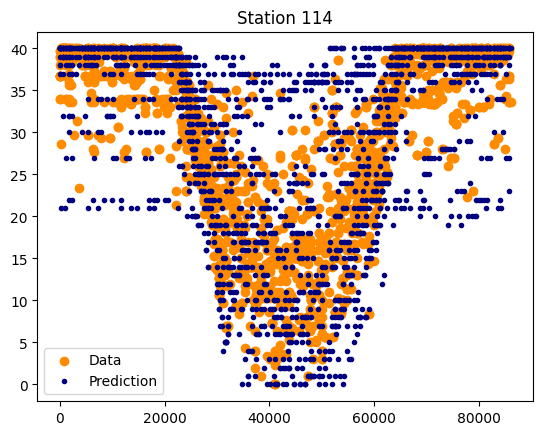

24.832904884318765
<class 'pandas.core.frame.DataFrame'> 1945 1945


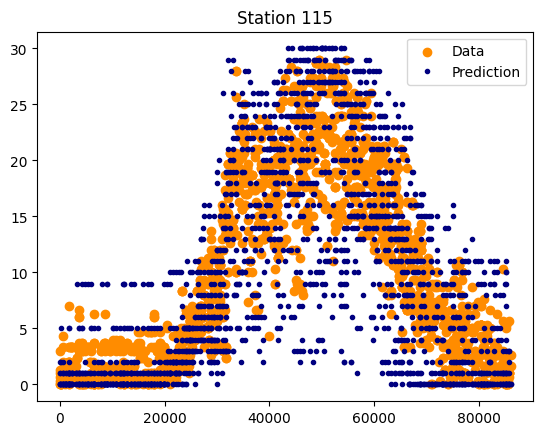

14.637223974763408
<class 'pandas.core.frame.DataFrame'> 1585 1585


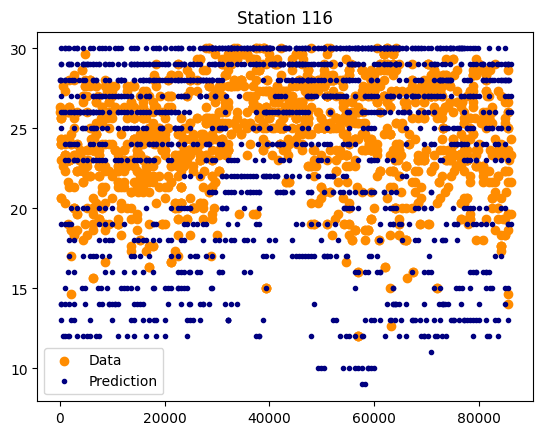

9.45541591861161
<class 'pandas.core.frame.DataFrame'> 1671 1671


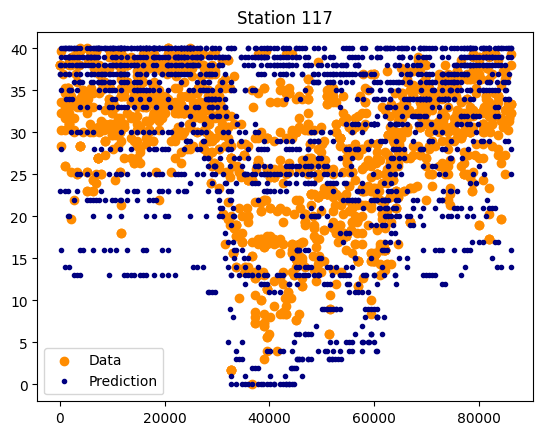

In [63]:
predictions = []
per = []
with PdfPages('station_plots.pdf') as pdf:
    for num in station_number:
        x_set_num = x_set.loc[x_set['number'] == num]
        y_set_num = y_set[x_set['number'] == num]
        x_set_num.drop('number',axis=1)
        #scaler = StandardScaler()
        #x_scaled = scaler.fit_transform(x_set_num)
        #print(x_set_num.shape[0])
        highest  = y_set_num.max()
        x_train, x_test, y_train, y_test = train_test_split(x_set_num, y_set_num, test_size=0.33, random_state=42)
        neigh = KNeighborsRegressor(3)
        neigh.fit(x_train, y_train)
        y_pred = neigh.predict(x_test)
        #predictions[num] = y_pred
        count = 0
        for i in range(len(y_pred)):
            if abs(y_pred[i] - y_test.iloc[i]) <= 1:
                count += 1
        print(count / len(y_pred) * 100)
        print(type(x_test),y_pred.size,y_test.shape[0])
        per.append(count / len(y_pred) * 100)
        plt.figure()
        plt.scatter(x_test['time_as_fraction'], y_pred, color="darkorange", label="Data")
        plt.plot(x_test['time_as_fraction'], y_test.to_numpy(), 'o', color="navy", label="Prediction", markersize=3)
        plt.axis("tight")
        plt.title(f"Station {num}")
        plt.legend()
        pdf.savefig()
        plt.show()

In [ ]:

predictions = {}
for num in station_number:
    x_set_num = x_set.loc[x_set['number'] == num]
    y_set_num = y_set[x_set['number'] == num]
    #print(x_set_num.shape[0])
    x_train, x_test, y_train, y_test = train_test_split(x_set, y_set, test_size=0.33, random_state=42)
    neigh = KNeighborsRegressor(n_neighbors=2)
    neigh.fit(x_train, y_train)
    y_pred = neigh.predict(x_test)
    predictions[num] = y_pred
    count = 0
    for i in range(len(y_pred)):
        if abs(y_pred[i] - y_test.iloc[i]) <= 1:
            count += 1
    print(count / len(y_pred) * 100)



In [7]:
models = {}

for station in station_number:
    df_station = df[df["number"] == station]

    X = df_station[['number','time_as_fraction','day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','day_of_week_5','day_of_week_6','temp','feels_like']]
    X = X.drop('number',axis=1)
    y = df_station["available_bikes"]

    # Preprocess the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(
        X_scaled, y, test_size=0.2, random_state=42
    )

    # Train a KNN model
    model = KNeighborsRegressor()
    model.fit(X_train, y_train)

    # Store the model in the dictionary
    models[station] = model

    # Make predictions on the testing data
    y_pred = model.predict(X_test)
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Station {station} - Mean Squared Error: {mse}, R^2 Score: {r2}")
    count = 0
    for i in range(len(y_pred)):
        if abs(y_pred[i] - y_test.iloc[i]) <= 1:
            count += 1
    print(count / len(y_pred) * 100)

Station 1 - Mean Squared Error: 2.788354866494401, R^2 Score: 0.9693454100949566
73.9879414298019
Station 2 - Mean Squared Error: 1.171268151016457, R^2 Score: 0.9501292862629306
84.70474346563408
Station 3 - Mean Squared Error: 1.2313978494623656, R^2 Score: 0.9619928288423639
78.76344086021506
Station 4 - Mean Squared Error: 1.559031945788964, R^2 Score: 0.9437998722781062
83.73668925459826
Station 5 - Mean Squared Error: 5.438862559241707, R^2 Score: 0.9719807835821759
67.21958925750396
Station 6 - Mean Squared Error: 0.8689161168708764, R^2 Score: 0.9623585586428722
79.17059377945334
Station 7 - Mean Squared Error: 2.918590998043053, R^2 Score: 0.9478970630057361
80.91976516634051
Station 8 - Mean Squared Error: 4.340398009950249, R^2 Score: 0.9308164816053934
68.24212271973465
Station 9 - Mean Squared Error: 3.7358472553699276, R^2 Score: 0.928840158402758
66.34844868735084
Station 10 - Mean Squared Error: 1.5898059964726632, R^2 Score: 0.915041689368462
77.07231040564373
Station 

In [46]:



X = df[['number','time_as_fraction','day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','day_of_week_5','day_of_week_6','temp','feels_like']]
X = X.drop('number',axis=1)
y = df["available_bikes"]

    # Preprocess the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled=pd.DataFrame(X_scaled)
print(X_scaled)
X_scaled.describe()


               0         1         2         3         4         5         6  \
0       1.352804 -0.380172 -0.396521 -0.450132 -0.449363  2.310536 -0.375246   
1       1.327912 -0.380172 -0.396521 -0.450132 -0.449363  2.310536 -0.375246   
2       1.303020 -0.380172 -0.396521 -0.450132 -0.449363  2.310536 -0.375246   
3       1.278129 -0.380172 -0.396521 -0.450132 -0.449363  2.310536 -0.375246   
4       1.253237 -0.380172 -0.396521 -0.450132 -0.449363  2.310536 -0.375246   
...          ...       ...       ...       ...       ...       ...       ...   
622716  1.564385 -0.380172  2.521936 -0.450132 -0.449363 -0.432800 -0.375246   
622717  1.539493 -0.380172  2.521936 -0.450132 -0.449363 -0.432800 -0.375246   
622718  1.514601 -0.380172  2.521936 -0.450132 -0.449363 -0.432800 -0.375246   
622719  1.489710 -0.380172  2.521936 -0.450132 -0.449363 -0.432800 -0.375246   
622720  1.464818 -0.380172  2.521936 -0.450132 -0.449363 -0.432800 -0.375246   

               7         8         9  


,0,1,2,3,4,5,6,7,8,9
count,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05
mean,6.273378e-17,-4.633719e-17,1.262663e-16,1.549974e-16,-1.149701e-16,-6.143300e-17,1.606797e-16,-1.479458e-16,-1.294387e-14,-2.352026e-15
std,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00
min,-1.820911e+00,-3.801723e-01,-3.965208e-01,-4.501324e-01,-4.493633e-01,-4.327999e-01,-3.752456e-01,-3.695818e-01,-2.663719e+00,-2.670469e+00
25%,-8.252354e-01,-3.801723e-01,-3.965208e-01,-4.501324e-01,-4.493633e-01,-4.327999e-01,-3.752456e-01,-3.695818e-01,-6.154552e-01,-6.990682e-01
50%,2.108857e-02,-3.801723e-01,-3.965208e-01,-4.501324e-01,-4.493633e-01,-4.327999e-01,-3.752456e-01,-3.695818e-01,-6.346545e-02,-1.809277e-01
75%,8.300747e-01,-3.801723e-01,-3.965208e-01,-4.501324e-01,-4.493633e-01,-4.327999e-01,-3.752456e-01,-3.695818e-01,6.829357e-01,8.948306e-01
max,1.751074e+00,2.630386e+00,2.521936e+00,2.221569e+00,2.225371e+00,2.310536e+00,2.664921e+00,2.705761e+00,2.325018e+00,2.192649e+00


In [64]:
sum(per)/117

15.488161673854327

In [61]:
print(per)

[172, 392, 269, 266, 226, 326, 151, 251, 271, 406, 570, 386, 438, 247, 497, 272, 597, 303, 413, 505, 213, 252, 295, 305, 285, 292, 389, 220, 200, 464, 265, 262, 355, 237, 175, 213, 398, 260, 445, 251, 340, 296, 237, 334, 181, 532, 169, 181, 159, 246, 241, 363, 188, 543, 196, 242, 205, 425, 233, 418, 219, 227, 175, 345, 265, 191, 215, 188, 305, 277, 359, 177, 151, 187, 190, 194, 502, 187, 285, 198, 221, 167, 238, 147, 175, 785, 277, 199, 238, 279, 157, 185, 166, 171, 130, 292, 365, 330, 160, 361, 178, 195, 215, 164, 194, 208, 195, 687, 231, 298, 461, 483, 232, 158]
